In [32]:
import torch
import torch.nn.functional as F
import torch.nn as nn
import torch.optim as optim
import math
from tqdm import tqdm

In [33]:
device = 'cpu'

In [34]:
# Random generators for reproducibility
X_train_gen = torch.Generator(device=device)   
X_train_gen.manual_seed(1) 
X_test_gen = torch.Generator(device=device) 
Noise_gen = torch.Generator()
Noise_gen.manual_seed(5)
Sample_gen = torch.Generator(device=device)
Sample_gen.manual_seed(3)

In [35]:
# helper functions
def mse(X,Y):
    losses = (X-Y)**2
    return losses.mean()

def single_index(n, d, gen, device="cpu"):
    theta = torch.ones(d).to(device) * 1
    theta[1:] = 0
    X =  torch.normal(mean = 0, std = 1, size = (n, d), device = device, requires_grad = False, generator = gen)
    Y = X @ theta
    return X, Y

def var(X):
    return torch.var(X)
    
def second_moment(X):
    return var(X) + (torch.mean(X)) ** 2

In [36]:
# Parameters
mode = "ntk"
d = 20        # input dimension
m = 1000      # neuron width
n = 200       # number of data

eta_1 = 1e-3   # learning rate for W
eta_2 = 0      # learning rate for a (controlled by oscillations)

label_noise = False  # whether to use label noise
B = 1                # batch size
k_sigma = 0          # label noise scale
k_1 = 1/d * k_sigma  # +- constant
epoch_num = 100001   # number of steps
criterion = mse      # loss function

In [37]:
class TwoLayerNN(nn.Module):
    def __init__(self, d, m, scale="ntk"):
        super(TwoLayerNN, self).__init__()
        W1_gen = torch.Generator()
        W1_gen.manual_seed(4) 
        W2_gen = torch.Generator()
        W2_gen.manual_seed(3)

        # Initialize W (m,d)
        W = torch.randn(m, d, generator=W1_gen) 
        W = W / (d ** 0.5)
        self.W = nn.Parameter(W, requires_grad=True)

        # Initialize a~N(0,1) (m,1)
        a = torch.randn(m, 1, generator=W2_gen)
        a = a / (m ** 0.5)

        for i in range(m):
            values = torch.tensor( [(eta_1 ** 0.25), 0, -(eta_1 ** 0.25)])  
            probs = torch.tensor([1/4, 1/2, 1/4])  
            index = torch.multinomial(probs, 1)
            selected_value = values[index]
            a[i][0] = selected_value
          
        self.a = nn.Parameter(a, requires_grad=True)
        self.scale = scale
        self.m = m

    def forward(self, X): #X:(n,d) W:(m,d) a:(m,1)
        # ntk setting: /sqrt(d)/sqrt(m)
        output = X @ self.W.T @ self.a   # shape: (T, n, m)
        return output

In [38]:
# Generate training and test data
X_GD,Y_GD = single_index(n, d, X_train_gen, device=device)
X_test, Y_test = single_index(n, d, X_test_gen, device=device)
print(X_GD)
print(Y_GD[:10])
print(X_test)
print(Y_test[:10])

tensor([[-1.5256, -0.7502, -0.6540,  ..., -1.1608,  0.6995,  0.1991],
        [ 0.8657,  0.2444, -0.6629,  ...,  0.0457,  0.1530, -0.4757],
        [-0.1110,  0.2927, -0.1578,  ...,  0.9386, -0.1860, -0.6446],
        ...,
        [ 0.6381, -0.3540, -0.5431,  ...,  1.9151, -0.6811,  0.7034],
        [-0.8180, -0.4039, -1.2104,  ..., -1.0875, -0.2432, -0.0727],
        [ 0.0742,  0.5778, -1.0970,  ..., -1.1242,  0.9775,  0.7015]])
tensor([-1.5256,  0.8657, -0.1110,  1.5392, -0.5065,  1.3851,  2.5581,  2.2952,
         0.4175, -0.9640])
tensor([[-0.1737, -1.8225,  0.7792,  ..., -1.9745,  1.5358,  0.5033],
        [ 1.2364, -0.7147,  0.0041,  ..., -0.9549,  0.3995,  0.1250],
        [ 2.0879, -0.2450, -0.2927,  ...,  1.0148, -0.1364,  1.0802],
        ...,
        [-0.6677,  1.2787,  1.1509,  ..., -0.4065,  0.4354, -0.6589],
        [-0.1866, -1.1444, -1.3670,  ...,  0.4300, -2.3673,  0.1478],
        [ 0.5755, -0.4983, -0.9520,  ...,  0.9588, -0.6980, -0.3095]])
tensor([-0.1737,  1.2364,

In [39]:
# Create model
torch.cuda.empty_cache()
model = TwoLayerNN(d, m,scale=mode).to(device)

W1_list = []
W2_list = []

losses = []
total_losses = []
test_losses = []
indexes_large_loss = []

check_num = 248
check_pos = [i * (epoch_num // check_num) for i in range(check_num)]
check_idx = 0

print(check_pos)
print(model.a)

[0, 403, 806, 1209, 1612, 2015, 2418, 2821, 3224, 3627, 4030, 4433, 4836, 5239, 5642, 6045, 6448, 6851, 7254, 7657, 8060, 8463, 8866, 9269, 9672, 10075, 10478, 10881, 11284, 11687, 12090, 12493, 12896, 13299, 13702, 14105, 14508, 14911, 15314, 15717, 16120, 16523, 16926, 17329, 17732, 18135, 18538, 18941, 19344, 19747, 20150, 20553, 20956, 21359, 21762, 22165, 22568, 22971, 23374, 23777, 24180, 24583, 24986, 25389, 25792, 26195, 26598, 27001, 27404, 27807, 28210, 28613, 29016, 29419, 29822, 30225, 30628, 31031, 31434, 31837, 32240, 32643, 33046, 33449, 33852, 34255, 34658, 35061, 35464, 35867, 36270, 36673, 37076, 37479, 37882, 38285, 38688, 39091, 39494, 39897, 40300, 40703, 41106, 41509, 41912, 42315, 42718, 43121, 43524, 43927, 44330, 44733, 45136, 45539, 45942, 46345, 46748, 47151, 47554, 47957, 48360, 48763, 49166, 49569, 49972, 50375, 50778, 51181, 51584, 51987, 52390, 52793, 53196, 53599, 54002, 54405, 54808, 55211, 55614, 56017, 56420, 56823, 57226, 57629, 58032, 58435, 58838, 

In [40]:
# Specific neuron check setup
Spec_neuron_check_num = 3
W1_check_pos = [i * 29 for i in range(Spec_neuron_check_num)]
W2_check_pos = [i * 29 for i in range(Spec_neuron_check_num)]

Spec_neuron_check_num += 2
W1_check_pos.append(58)
W1_check_pos.append(13)
W2_check_pos.append(58)
W2_check_pos.append(13)

W1_spec_norm = []
W1_spec_cossim = []
W2_check_list = []
W1_W1pre_spec_vari = []
for i in range(Spec_neuron_check_num):
     W1_spec_norm.append([])
     W1_spec_cossim.append([])
     W2_check_list.append([])
     W1_W1pre_spec_vari.append([])

In [41]:
# initial value

W1_list.append(model.W.detach().clone())
W2_list.append(model.a.detach().clone())

In [42]:
# find the hign and low alignment neuron

high_value = 0.6
low_value = 0.01
count_1 = 0
count_2 = 0 
for i in range(m):
     # find the high alignment
     if abs(W1_list[0][i][0].item() / W1_list[0][i].norm().item()) > high_value and count_1 <= 2:
          Spec_neuron_check_num += 1
          count_1 += 1
          W1_check_pos.append(i)
          W2_check_pos.append(i)
          W1_spec_norm.append([])
          W1_spec_cossim.append([])
          W2_check_list.append([])
          W1_W1pre_spec_vari.append([])
          print(i, W1_list[0][i][0].item() / W1_list[0][i].norm().item())

     # find the low alignment
     if abs(W1_list[0][i][0].item() / W1_list[0][i].norm().item()) < low_value and count_2 <= 2:
          count_2 += 1
          Spec_neuron_check_num += 1
          W1_check_pos.append(i)
          W2_check_pos.append(i)
          W1_spec_norm.append([])
          W1_spec_cossim.append([])
          W2_check_list.append([])
          W1_W1pre_spec_vari.append([])
          print(i, W1_list[0][i][0].item() / W1_list[0][i].norm().item())

27 0.009812478078201726
95 -0.0030371507872257986
139 -0.009542776843035644
524 0.6038194083401222
568 0.6840742892533226
676 -0.6222550248665116


In [43]:
for i in range(Spec_neuron_check_num):
     W1_spec_norm[i].append(W1_list[0][W1_check_pos[i]].norm().item())
     W2_check_list[i].append(W2_list[0][W2_check_pos[i]].norm().item())
     W1_spec_cossim[i].append(W1_list[0][W1_check_pos[i]][0].item() / W1_list[0][W1_check_pos[i]].norm().item())
     W1_W1pre_spec_vari.append(W1_list[0][W1_check_pos[i]].norm().item())
     
check_idx += 1
print(W1_spec_norm)
print(W1_spec_cossim)
print(W2_check_list)

[[1.0390665531158447], [0.99335777759552], [0.927873432636261], [0.927873432636261], [1.361335277557373], [1.1725544929504395], [0.8880513310432434], [0.946675181388855], [0.9641717672348022], [1.2185946702957153], [0.9478635787963867]]
[[-0.20259253272194397], [-0.14284127629685214], [-0.2540422343664694], [-0.2540422343664694], [0.28773231329557636], [0.009812478078201726], [-0.0030371507872257986], [-0.009542776843035644], [0.6038194083401222], [0.6840742892533226], [-0.6222550248665116]]
[[0.0], [0.17782793939113617], [0.17782793939113617], [0.17782793939113617], [0.17782793939113617], [0.17782793939113617], [0.17782793939113617], [0.17782793939113617], [0.0], [0.17782793939113617], [0.17782793939113617]]


In [44]:
W1_norm_means = []
W2_norm_means = []
W1_pre = torch.zeros(m).unsqueeze(1).to(device)
W2_pre = torch.zeros(m).unsqueeze(1).to(device)

In [45]:
optimizer = optim.SGD([{'params': model.W, 'lr': eta_1},{'params': model.a, 'lr': eta_2}])

indices = range(n)
X = X_GD[indices,:].to(device)
Y = Y_GD[indices].to(device)

theta = torch.ones(d).to(device) * 1
theta[1:] = 0

for i in tqdm(range(epoch_num)):
     model.zero_grad()
     with torch.no_grad():
          if check_idx < check_num and check_pos[check_idx] == i:
               W1_temp = model.W.detach().clone()
               W2_temp = model.a.detach().clone()
               W1_list.append(W1_temp)
               W2_list.append(W2_temp)
               check_idx += 1

     N = 2 * torch.randint(0, 2, (n,1), generator = Noise_gen).squeeze() - 1
     N = N.to(device)
     if(label_noise):
          Y_noisy = Y + k_1 * N
     else:
          Y_noisy = Y
     
     output = model(X).squeeze()
     loss = criterion(output,Y_noisy)
     
     Y_tmp = model(X_GD).squeeze()
     Y_tmp_test = model(X_test).squeeze()

     with torch.no_grad():
          losses.append(loss.item())
          total_losses.append(criterion(Y_tmp, Y_GD).item())
          test_losses.append(criterion(Y_tmp_test, Y_test).item())
          if loss.item() > 1:
               indexes_large_loss.append(i)

          W1_temp = model.W.detach().clone()
          W2_temp = model.a.detach().clone()

          # compute the mean
          W1_norms = torch.norm(W1_temp, dim=1)
          mean_norm = W1_norms.mean().item() 
          W1_norm_means.append(mean_norm)

          W2_norms = torch.norm(W2_temp, dim=1)
          mean_norm = W2_norms.mean().item() 
          W2_norm_means.append(mean_norm)

          for j in range(Spec_neuron_check_num):
               W2_check_list[j].append(W2_temp[W2_check_pos[j]].item())
               W1_spec_norm[j].append(W1_temp[W1_check_pos[j]].norm().item())
               W1_spec_cossim[j].append(W1_temp[W1_check_pos[j]][0].item() / W1_temp[W1_check_pos[j]].norm().item())
               W1_W1pre_spec_vari[j].append((W1_temp[W2_check_pos[j]] * W1_pre[W2_check_pos[j]]).sum().item())

          W1_pre = W1_temp
          W2_pre = W2_temp
               
     loss.backward()
     optimizer.step()

     # update the weights in the second layer by oscillations
     with torch.no_grad():
          N1 = (2 * torch.randint(0, 2, (m,1), generator = Noise_gen) - 1) * (eta_1 ** 0.25)
          N1 = N1.to(device)
          mask_1 = model.a >= (eta_1 ** 0.25)
          mask_2 = model.a <= -(eta_1 ** 0.25)
          mask_3 = model.a.abs() < (eta_1 ** 0.25)
          model.a[mask_1] -= abs(N1[mask_1])
          model.a[mask_2] += abs(N1[mask_2])
          model.a[mask_3] += N1[mask_3]

     if(i % 1000 == 0):
          with torch.no_grad():
               print("loss:",criterion(model(X).squeeze(),Y))
               print("total_loss:",criterion(Y_tmp, Y_GD))
               print("test_loss:",criterion(Y_tmp_test, Y_test))
model.zero_grad()

  0%|          | 0/100001 [00:00<?, ?it/s]

loss:

  0%|          | 16/100001 [00:00<10:33, 157.93it/s]

 tensor(13.2829)
total_loss: tensor(14.2593)
test_loss: tensor(14.9461)


  1%|          | 1046/100001 [00:03<04:39, 354.13it/s]

loss: tensor(18.4113)
total_loss: tensor(16.8621)
test_loss: tensor(15.9379)


  2%|▏         | 2064/100001 [00:06<05:26, 299.86it/s]

loss: tensor(8.6340)
total_loss: tensor(10.5739)
test_loss: tensor(10.1432)


  3%|▎         | 3049/100001 [00:09<04:56, 326.63it/s]

loss: tensor(12.8105)
total_loss: tensor(11.2058)
test_loss: tensor(10.4518)


  4%|▍         | 4057/100001 [00:13<05:39, 282.52it/s]

loss: tensor(19.2423)
total_loss: tensor(14.5881)
test_loss: tensor(12.5773)


  5%|▌         | 5047/100001 [00:16<04:05, 386.70it/s]

loss: tensor(16.0928)
total_loss: tensor(8.3911)
test_loss: tensor(8.3187)


  6%|▌         | 6072/100001 [00:19<04:24, 355.42it/s]

loss: tensor(10.6478)
total_loss: tensor(10.7548)
test_loss: tensor(10.7864)


  7%|▋         | 7047/100001 [00:22<04:37, 334.98it/s]

loss: tensor(15.6660)
total_loss: tensor(9.2689)
test_loss: tensor(8.9241)


  8%|▊         | 8050/100001 [00:25<04:23, 348.77it/s]

loss: tensor(12.3993)
total_loss: tensor(12.3172)
test_loss: tensor(14.8339)


  9%|▉         | 9058/100001 [00:29<04:57, 305.40it/s]

loss: tensor(11.6480)
total_loss: tensor(6.6653)
test_loss: tensor(6.1428)


 10%|█         | 10038/100001 [00:32<05:00, 299.67it/s]

loss: tensor(7.8568)
total_loss: tensor(10.2063)
test_loss: tensor(11.4493)


 11%|█         | 11046/100001 [00:35<03:44, 396.31it/s]

loss: tensor(16.0996)
total_loss: tensor(6.4627)
test_loss: tensor(7.9864)


 12%|█▏        | 12045/100001 [00:38<03:49, 382.72it/s]

loss: tensor(6.8687)
total_loss: tensor(6.2501)
test_loss: tensor(7.4793)


 13%|█▎        | 13050/100001 [00:41<04:57, 292.26it/s]

loss: tensor(8.9535)
total_loss: tensor(7.2614)
test_loss: tensor(8.3374)


 14%|█▍        | 14061/100001 [00:46<05:19, 268.89it/s]

loss: tensor(7.0404)
total_loss: tensor(11.1142)
test_loss: tensor(10.5325)


 15%|█▌        | 15051/100001 [00:49<04:57, 285.60it/s]

loss: tensor(4.7834)
total_loss: tensor(4.1684)
test_loss: tensor(3.7581)


 16%|█▌        | 16038/100001 [00:52<04:16, 326.91it/s]

loss: tensor(4.3171)
total_loss: tensor(2.1141)
test_loss: tensor(2.4471)


 17%|█▋        | 17038/100001 [00:55<04:21, 317.18it/s]

loss: tensor(6.6211)
total_loss: tensor(5.8930)
test_loss: tensor(4.8913)


 18%|█▊        | 18040/100001 [00:58<03:47, 360.14it/s]

loss: tensor(6.0041)
total_loss: tensor(5.6485)
test_loss: tensor(6.1548)


 19%|█▉        | 19044/100001 [01:00<03:46, 357.23it/s]

loss: tensor(8.6110)
total_loss: tensor(8.2690)
test_loss: tensor(6.6305)


 20%|██        | 20049/100001 [01:03<03:34, 371.95it/s]

loss: tensor(6.1341)
total_loss: tensor(3.7535)
test_loss: tensor(4.3923)


 21%|██        | 21070/100001 [01:06<03:31, 373.25it/s]

loss: tensor(3.6224)
total_loss: tensor(4.0061)
test_loss: tensor(4.2160)


 22%|██▏       | 22024/100001 [01:09<06:00, 216.35it/s]

loss: tensor(3.6317)
total_loss: tensor(4.6586)
test_loss: tensor(4.4672)


 23%|██▎       | 23065/100001 [01:12<03:36, 356.07it/s]

loss: tensor(4.5143)
total_loss: tensor(3.5923)
test_loss: tensor(3.4829)


 24%|██▍       | 24030/100001 [01:16<04:24, 287.30it/s]

loss: tensor(6.7911)
total_loss: tensor(3.5954)
test_loss: tensor(3.4110)


 25%|██▌       | 25021/100001 [01:21<04:57, 252.34it/s]

loss: tensor(4.8357)
total_loss: tensor(6.2310)
test_loss: tensor(5.8407)


 26%|██▌       | 26033/100001 [01:25<03:18, 373.33it/s]

loss: tensor(3.3837)
total_loss: tensor(3.9506)
test_loss: tensor(4.2189)


 27%|██▋       | 27053/100001 [01:28<03:08, 387.30it/s]

loss: tensor(3.4609)
total_loss: tensor(2.5685)
test_loss: tensor(2.2764)


 28%|██▊       | 28036/100001 [01:32<03:48, 314.99it/s]

loss: tensor(4.9267)
total_loss: tensor(2.9959)
test_loss: tensor(2.8992)


 29%|██▉       | 29067/100001 [01:35<03:21, 351.97it/s]

loss: tensor(4.1127)
total_loss: tensor(3.9078)
test_loss: tensor(4.8682)


 30%|███       | 30040/100001 [01:39<04:40, 249.59it/s]

loss: tensor(5.4122)
total_loss: tensor(3.6985)
test_loss: tensor(5.0837)


 31%|███       | 31051/100001 [01:42<03:11, 359.50it/s]

loss: tensor(2.5129)
total_loss: tensor(2.8123)
test_loss: tensor(3.1260)


 32%|███▏      | 32033/100001 [01:45<04:24, 257.03it/s]

loss: tensor(1.5604)
total_loss: tensor(2.7007)
test_loss: tensor(2.7928)


 33%|███▎      | 33065/100001 [01:49<03:15, 342.79it/s]

loss: tensor(3.3716)
total_loss: tensor(2.1333)
test_loss: tensor(1.8240)


 34%|███▍      | 34034/100001 [01:53<03:16, 336.47it/s]

loss: tensor(3.3678)
total_loss: tensor(3.1495)
test_loss: tensor(3.1172)


 35%|███▌      | 35064/100001 [01:56<03:23, 319.74it/s]

loss: tensor(3.2440)
total_loss: tensor(1.4402)
test_loss: tensor(1.6091)


 36%|███▌      | 36069/100001 [01:59<03:41, 289.10it/s]

loss: tensor(2.8078)
total_loss: tensor(2.4165)
test_loss: tensor(3.2420)


 37%|███▋      | 37035/100001 [02:02<03:28, 301.77it/s]

loss: tensor(2.1427)
total_loss: tensor(2.2125)
test_loss: tensor(2.0338)


 38%|███▊      | 38072/100001 [02:05<02:46, 371.18it/s]

loss: tensor(1.7253)
total_loss: tensor(2.2323)
test_loss: tensor(2.2686)


 39%|███▉      | 39009/100001 [02:09<03:19, 306.27it/s]

loss: tensor(1.8824)
total_loss: tensor(1.7398)
test_loss: tensor(1.7903)


 40%|████      | 40059/100001 [02:12<02:33, 389.61it/s]

loss: tensor(1.8799)
total_loss: tensor(4.1773)
test_loss: tensor(5.6831)


 41%|████      | 41037/100001 [02:16<04:25, 221.92it/s]

loss: tensor(2.5278)
total_loss: tensor(2.2164)
test_loss: tensor(2.1780)


 42%|████▏     | 42044/100001 [02:21<07:11, 134.43it/s]

loss: tensor(2.5722)
total_loss: tensor(2.8753)
test_loss: tensor(3.2329)


 43%|████▎     | 43011/100001 [02:26<07:36, 124.82it/s]

loss: tensor(1.0768)
total_loss: tensor(2.2332)
test_loss: tensor(3.1101)


 44%|████▍     | 44054/100001 [02:29<02:25, 384.38it/s]

loss: tensor(2.0517)
total_loss: tensor(2.4113)
test_loss: tensor(2.6501)


 45%|████▌     | 45072/100001 [02:36<02:43, 336.94it/s]

loss: tensor(1.5725)
total_loss: tensor(2.6190)
test_loss: tensor(2.4134)


 46%|████▌     | 46044/100001 [02:39<02:38, 340.86it/s]

loss: tensor(2.3039)
total_loss: tensor(1.4716)
test_loss: tensor(1.8964)


 47%|████▋     | 47005/100001 [02:42<02:31, 349.71it/s]

loss: tensor(1.6664)
total_loss: tensor(1.7888)
test_loss: tensor(1.9714)


 48%|████▊     | 48038/100001 [02:46<02:58, 291.38it/s]

loss: tensor(1.7231)
total_loss: tensor(1.3205)
test_loss: tensor(1.1130)


 49%|████▉     | 49056/100001 [02:50<02:47, 304.52it/s]

loss: tensor(2.3505)
total_loss: tensor(1.6048)
test_loss: tensor(1.7749)


 50%|█████     | 50075/100001 [02:53<02:23, 348.33it/s]

loss: tensor(2.1061)
total_loss: tensor(2.1585)
test_loss: tensor(2.4749)


 51%|█████     | 51041/100001 [02:56<02:22, 342.70it/s]

loss: tensor(2.4954)
total_loss: tensor(2.8054)
test_loss: tensor(3.2334)


 52%|█████▏    | 52042/100001 [02:59<02:45, 290.40it/s]

loss: tensor(1.1863)
total_loss: tensor(3.2461)
test_loss: tensor(2.7598)


 53%|█████▎    | 53022/100001 [03:03<03:31, 222.52it/s]

loss: tensor(2.3225)
total_loss: tensor(1.1816)
test_loss: tensor(1.2002)


 54%|█████▍    | 54067/100001 [03:06<02:02, 376.18it/s]

loss: tensor(2.2072)
total_loss: tensor(1.4163)
test_loss: tensor(1.2231)


 55%|█████▌    | 55063/100001 [03:10<02:34, 290.48it/s]

loss: tensor(0.8688)
total_loss: tensor(2.4565)
test_loss: tensor(3.0453)


 56%|█████▌    | 56046/100001 [03:13<02:43, 269.39it/s]

loss: tensor(2.3040)
total_loss: tensor(1.9141)
test_loss: tensor(2.0952)


 57%|█████▋    | 57075/100001 [03:16<02:17, 311.70it/s]

loss: tensor(2.5345)
total_loss: tensor(2.0408)
test_loss: tensor(2.3943)


 58%|█████▊    | 58027/100001 [03:20<02:36, 267.41it/s]

loss: tensor(1.0373)
total_loss: tensor(1.9239)
test_loss: tensor(2.4462)


 59%|█████▉    | 59064/100001 [03:23<01:52, 362.70it/s]

loss: tensor(2.1239)
total_loss: tensor(1.0786)
test_loss: tensor(0.9683)


 60%|██████    | 60066/100001 [03:26<02:07, 312.29it/s]

loss: tensor(1.5667)
total_loss: tensor(1.0218)
test_loss: tensor(0.9481)


 61%|██████    | 61068/100001 [03:28<01:48, 360.03it/s]

loss: tensor(0.9788)
total_loss: tensor(1.4276)
test_loss: tensor(1.1648)


 62%|██████▏   | 62065/100001 [03:31<01:41, 374.55it/s]

loss: tensor(1.0217)
total_loss: tensor(0.8457)
test_loss: tensor(0.8491)


 63%|██████▎   | 63020/100001 [03:34<02:07, 290.31it/s]

loss: tensor(1.4700)
total_loss: tensor(0.9816)
test_loss: tensor(0.8900)


 64%|██████▍   | 64058/100001 [03:38<01:46, 336.39it/s]

loss: tensor(1.7940)
total_loss: tensor(1.1154)
test_loss: tensor(0.9869)


 65%|██████▌   | 65033/100001 [03:41<02:13, 261.21it/s]

loss: tensor(1.6985)
total_loss: tensor(1.2280)
test_loss: tensor(1.1796)


 66%|██████▌   | 66021/100001 [03:46<02:51, 197.69it/s]

loss: tensor(1.4501)
total_loss: tensor(1.1740)
test_loss: tensor(1.1547)


 67%|██████▋   | 67050/100001 [03:51<01:33, 351.37it/s]

loss: tensor(1.1087)
total_loss: tensor(1.5971)
test_loss: tensor(1.7927)


 68%|██████▊   | 68039/100001 [03:53<01:20, 399.16it/s]

loss: tensor(1.5272)
total_loss: tensor(1.1143)
test_loss: tensor(1.1937)


 69%|██████▉   | 69040/100001 [03:56<01:28, 351.81it/s]

loss: tensor(1.5874)
total_loss: tensor(1.9467)
test_loss: tensor(1.7697)


 70%|███████   | 70057/100001 [03:59<01:18, 380.28it/s]

loss: tensor(0.7512)
total_loss: tensor(0.5906)
test_loss: tensor(0.5531)


 71%|███████   | 71058/100001 [04:01<01:20, 360.73it/s]

loss: tensor(0.9233)
total_loss: tensor(1.1130)
test_loss: tensor(1.1030)


 72%|███████▏  | 72055/100001 [04:04<01:10, 398.00it/s]

loss: tensor(1.4932)
total_loss: tensor(1.2101)
test_loss: tensor(1.4413)


 73%|███████▎  | 73060/100001 [04:06<01:07, 398.34it/s]

loss: tensor(1.3562)
total_loss: tensor(1.6996)
test_loss: tensor(1.9122)


 74%|███████▍  | 74045/100001 [04:09<01:08, 376.43it/s]

loss: tensor(1.0216)
total_loss: tensor(1.5918)
test_loss: tensor(1.3836)


 75%|███████▌  | 75093/100001 [04:12<01:01, 408.06it/s]

loss: tensor(1.7390)
total_loss: tensor(0.9849)
test_loss: tensor(1.0220)


 76%|███████▌  | 76051/100001 [04:14<01:01, 392.16it/s]

loss: tensor(1.3605)
total_loss: tensor(1.4188)
test_loss: tensor(1.5473)


 77%|███████▋  | 77038/100001 [04:17<01:26, 264.34it/s]

loss: tensor(1.3002)
total_loss: tensor(1.9498)
test_loss: tensor(1.9009)


 78%|███████▊  | 78047/100001 [04:20<00:55, 392.74it/s]

loss: tensor(2.0066)
total_loss: tensor(1.4316)
test_loss: tensor(1.5373)


 79%|███████▉  | 79055/100001 [04:23<01:03, 327.60it/s]

loss: tensor(1.2143)
total_loss: tensor(1.5117)
test_loss: tensor(1.4727)


 80%|████████  | 80058/100001 [04:26<00:56, 352.20it/s]

loss: tensor(1.7422)
total_loss: tensor(1.3572)
test_loss: tensor(1.3394)


 81%|████████  | 81074/100001 [04:29<00:54, 347.99it/s]

loss: tensor(1.8881)
total_loss: tensor(0.7790)
test_loss: tensor(0.6935)


 82%|████████▏ | 82043/100001 [04:32<00:57, 314.42it/s]

loss: tensor(0.9745)
total_loss: tensor(1.3908)
test_loss: tensor(1.3562)


 83%|████████▎ | 83042/100001 [04:36<00:51, 326.23it/s]

loss: tensor(1.7683)
total_loss: tensor(1.3020)
test_loss: tensor(1.4230)


 84%|████████▍ | 84041/100001 [04:38<00:45, 354.12it/s]

loss: tensor(1.5043)
total_loss: tensor(1.0060)
test_loss: tensor(0.8188)


 85%|████████▌ | 85037/100001 [04:41<00:40, 367.43it/s]

loss: tensor(0.5217)
total_loss: tensor(1.0202)
test_loss: tensor(0.9663)


 86%|████████▌ | 86061/100001 [04:44<00:35, 390.48it/s]

loss: tensor(1.9134)
total_loss: tensor(0.8522)
test_loss: tensor(0.6922)


 87%|████████▋ | 87077/100001 [04:46<00:32, 399.86it/s]

loss: tensor(0.9949)
total_loss: tensor(1.7799)
test_loss: tensor(1.6205)


 88%|████████▊ | 88046/100001 [04:50<00:34, 349.68it/s]

loss: tensor(1.4810)
total_loss: tensor(1.1971)
test_loss: tensor(1.1056)


 89%|████████▉ | 89058/100001 [04:52<00:28, 387.85it/s]

loss: tensor(0.8632)
total_loss: tensor(0.7834)
test_loss: tensor(0.7451)


 90%|█████████ | 90052/100001 [04:55<00:36, 273.37it/s]

loss: tensor(1.0527)
total_loss: tensor(0.6950)
test_loss: tensor(0.8195)


 91%|█████████ | 91033/100001 [04:59<00:25, 356.78it/s]

loss: tensor(1.2192)
total_loss: tensor(0.5853)
test_loss: tensor(0.5289)


 92%|█████████▏| 92071/100001 [05:02<00:21, 371.64it/s]

loss: tensor(1.3179)
total_loss: tensor(1.7191)
test_loss: tensor(1.4619)


 93%|█████████▎| 93040/100001 [05:05<00:20, 341.96it/s]

loss: tensor(1.4477)
total_loss: tensor(1.4043)
test_loss: tensor(1.3388)


 94%|█████████▍| 94048/100001 [05:08<00:15, 374.31it/s]

loss: tensor(0.8880)
total_loss: tensor(1.1011)
test_loss: tensor(1.0070)


 95%|█████████▌| 95047/100001 [05:11<00:12, 409.53it/s]

loss: tensor(1.7342)
total_loss: tensor(1.3445)
test_loss: tensor(1.2337)


 96%|█████████▌| 96043/100001 [05:14<00:10, 375.48it/s]

loss: tensor(0.9713)
total_loss: tensor(1.2189)
test_loss: tensor(1.0765)


 97%|█████████▋| 97010/100001 [05:17<00:13, 226.15it/s]

loss: tensor(1.1675)
total_loss: tensor(1.5849)
test_loss: tensor(1.8801)


 98%|█████████▊| 98049/100001 [05:20<00:05, 350.94it/s]

loss: tensor(0.8109)
total_loss: tensor(1.1013)
test_loss: tensor(0.9565)


 99%|█████████▉| 99030/100001 [05:23<00:02, 327.23it/s]

loss: tensor(1.2636)
total_loss: tensor(0.7598)
test_loss: tensor(0.7149)


100%|██████████| 100001/100001 [05:26<00:00, 305.88it/s]

loss: tensor(1.2147)
total_loss: tensor(1.0968)
test_loss: tensor(1.0076)


In [46]:
# W1 aligment
W1_norm_list = []
W1_cos_list = []
for num in range(check_num):
     W1_norm = [W1_list[num][i].norm().item() for i in range(m)]
     W1_cos = (W1_list[num] @ theta).detach().cpu().numpy() 
     W1_cos = [W1_cos[i] / W1_list[num][i].norm().item() for i in range(m)]
     W1_norm_list.append(W1_norm)
     W1_cos_list.append(W1_cos)

print(len(W1_norm))
print(len(W1_cos))
print(indexes_large_loss)
print(W1_cos_list[0])
print(W1_cos_list[1])

1000
1000
[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99, 100, 101, 102, 103, 104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155, 156, 157, 158, 159, 160, 161, 162, 163, 164, 165, 166, 167, 168, 169, 170, 171, 172, 173, 174, 175, 176, 177, 178, 179, 180, 181, 182, 183, 184, 185, 186, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 211, 212, 213, 214, 215, 216, 217, 218, 219,

In [47]:
# W2 observe
print(W2_list[3])
for num in range(check_num):
     W2_list[num] = W2_list[num].view(-1).tolist()
     
W2_x = [j for j in range(m)]
print(W2_x)
print(W2_list[1])

tensor([[ 0.1778],
        [ 0.1778],
        [-0.1778],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [ 0.1778],
        [-0.1778],
        [ 0.0000],
        [-0.1778],
        [-0.1778],
        [-0.1778],
        [-0.1778],
        [ 0.0000],
        [ 0.1778],
        [ 0.1778],
        [ 0.0000],
        [ 0.0000],
        [ 0.1778],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [-0.1778],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [-0.1778],
        [ 0.0000],
        [ 0.1778],
        [ 0.0000],
        [ 0.0000],
        [-0.1778],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [-0.1778],
        [ 0.0000],
        [-0.1778],
        [ 0.1778],
        [-0.1778],
        [ 0.0000],
        [ 0.1778],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [ 0.0000],
        [-0.1778],
        [-0.1778],
        [ 0.

In [48]:
# W1@W2 norm
W2_W1_norm = []
for i in range(check_num):
     W2_W1_norm.append([W1_norm_list[i][j] * abs(W2_list[i][j]) for j in range(m)])
print(W2_W1_norm[0])

[0.0, 0.0, 0.0, 0.16031320990824494, 0.216806406069459, 0.17263719414862955, 0.0, 0.0, 0.17173301479194958, 0.0, 0.0, 0.0, 0.0, 0.24208344722848807, 0.0, 0.0, 0.1242162776737139, 0.1402944425853736, 0.0, 0.1854718878895465, 0.1394963629339907, 0.18973658727267306, 0.0, 0.2673971410129834, 0.12656232128720468, 0.18714495622943872, 0.1763548917843769, 0.20851294930519515, 0.0, 0.17664676666796986, 0.0, 0.16086890313997415, 0.1351796630359603, 0.0, 0.18009291901400637, 0.19237385920811612, 0.15524660450074723, 0.0, 0.2089488590434616, 0.0, 0.0, 0.0, 0.13215877865954706, 0.0, 0.20386815647232304, 0.2332934947204155, 0.14986956471075796, 0.15462999668296984, 0.16645282145623597, 0.22665674086697507, 0.0, 0.0, 0.16966513047577259, 0.14590254866661923, 0.17443500648768673, 0.12691407201847227, 0.0, 0.1511912638967443, 0.1650018205414865, 0.0, 0.0, 0.13525148437493062, 0.0, 0.0, 0.20924157127737608, 0.0, 0.0, 0.1874262847387289, 0.13829114023766564, 0.0, 0.0, 0.0, 0.1998864391003874, 0.1668865

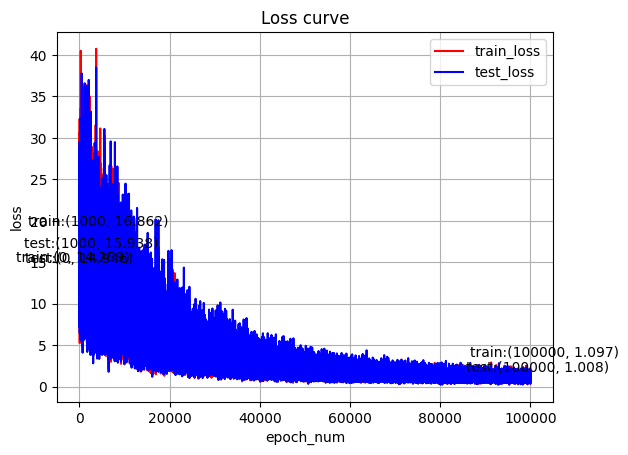

In [49]:
# plot loss

import matplotlib.pyplot as plt
mid_point = 1000
plt.figure()  
x = range(0, epoch_num)
plt.plot(x, losses, label='train_loss', color='red')
plt.plot(x, test_losses, label = 'test_loss', color='blue')
plt.annotate(f'train:({x[0]}, {losses[0]:.3f})',  
                 (x[0], losses[0]),
                 textcoords="offset points",     
                 xytext=(-5, 5),        
                 ha='center') 
plt.annotate(f'test:({x[0]}, {test_losses[0]:.3f})',  
                 (x[0], test_losses[0]),  
                 textcoords="offset points",     
                 xytext=(0,0),      
                 ha='center') 
plt.annotate(f'train:({x[mid_point]}, {losses[mid_point]:.3f})',  
                 (x[mid_point], losses[mid_point]),       
                 textcoords="offset points",     
                 xytext=(10, 15),             
                 ha='center') 
plt.annotate(f'test:({x[mid_point]}, {test_losses[mid_point]:.3f})',  
                 (x[mid_point], test_losses[mid_point]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center')  
plt.annotate(f'train:({x[epoch_num - 1]}, {losses[epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], losses[epoch_num - 1]),       
                 textcoords="offset points",     
                 xytext=(10, 15),             
                 ha='center') 
plt.annotate(f'test:({x[epoch_num - 1]}, {test_losses[epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], test_losses[epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)      
plt.title('Loss curve')
plt.xlabel('epoch_num')  
plt.ylabel('loss')  
# plt.ylim(0,40)  
plt.legend()  
plt.grid(True)  
plt.show()  

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


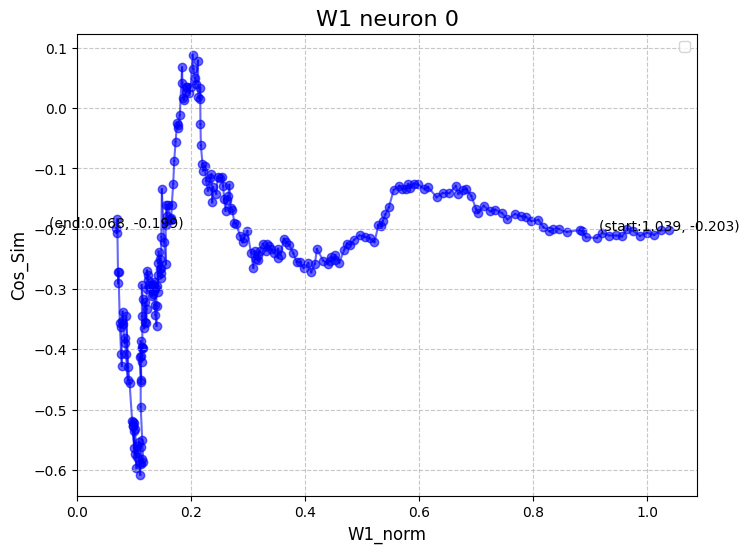

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


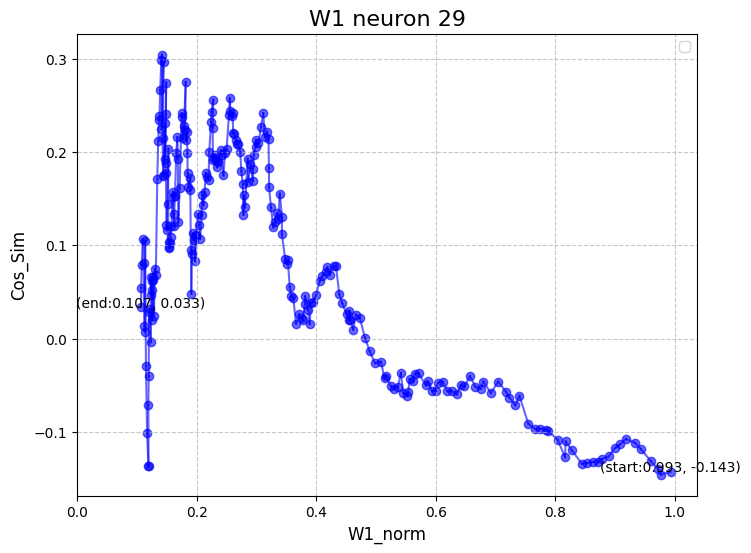

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


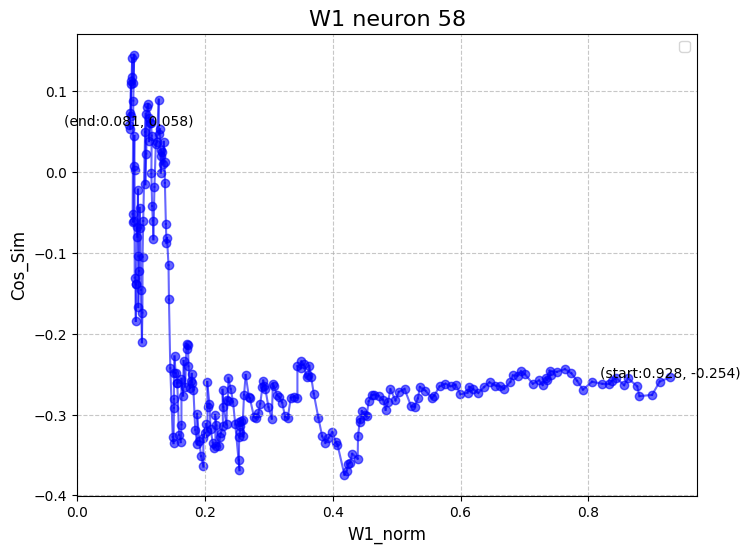

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


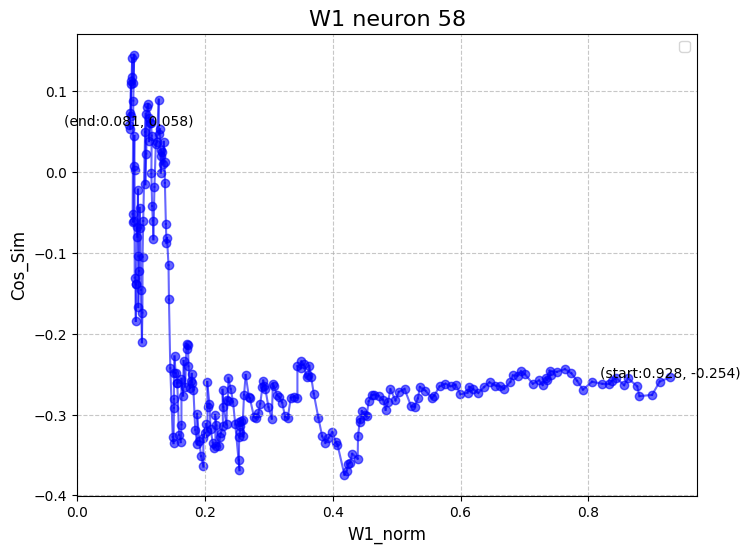

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


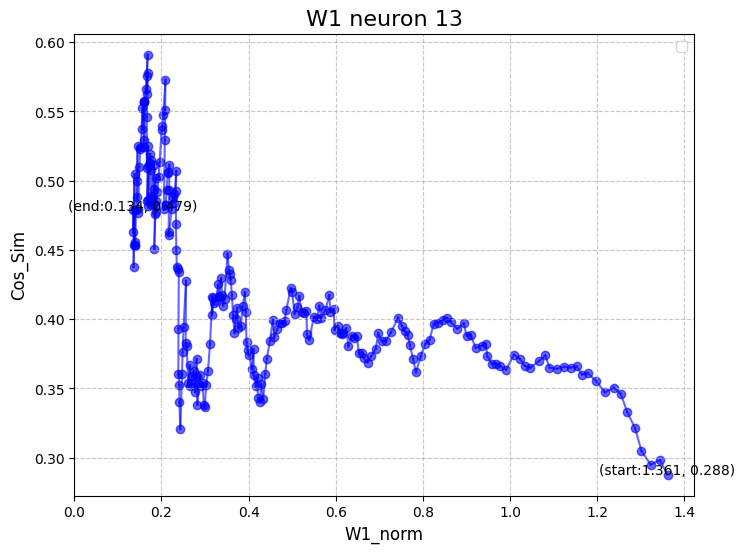

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


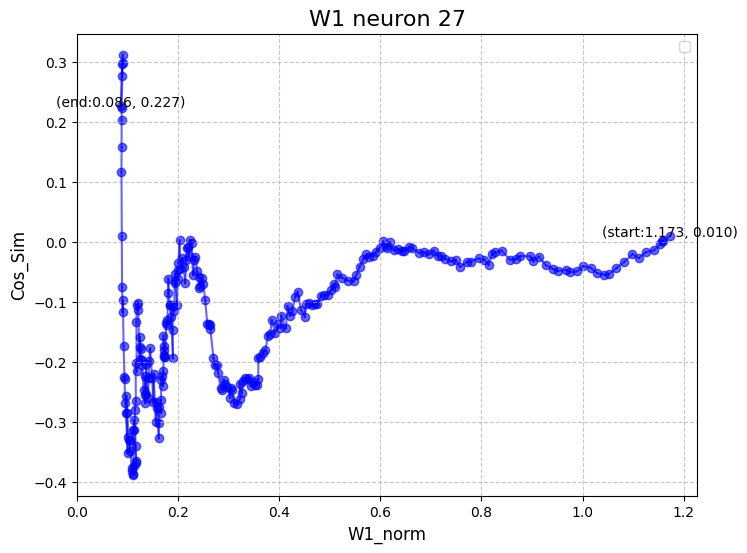

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


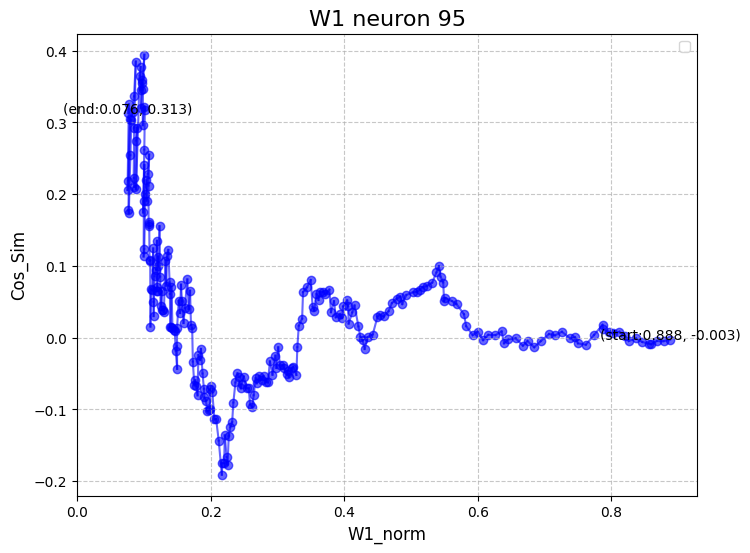

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


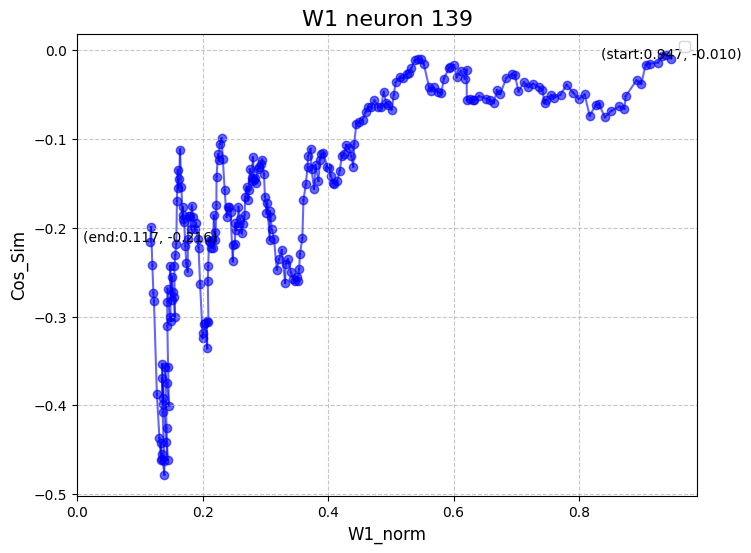

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


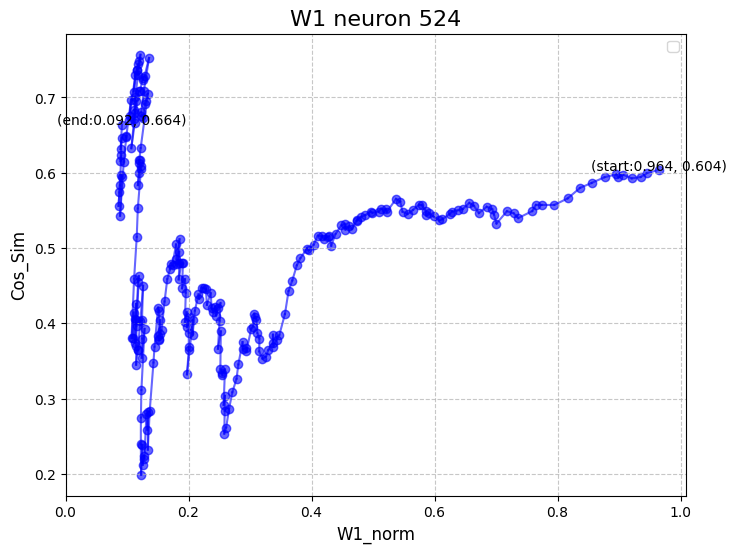

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


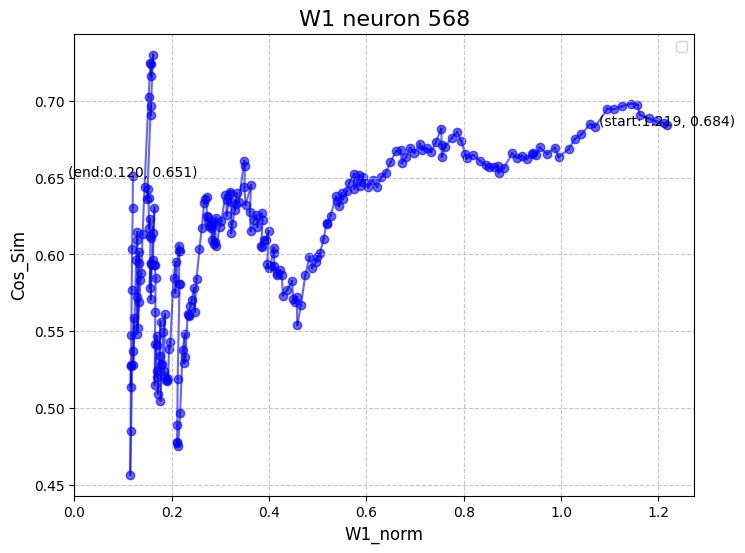

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


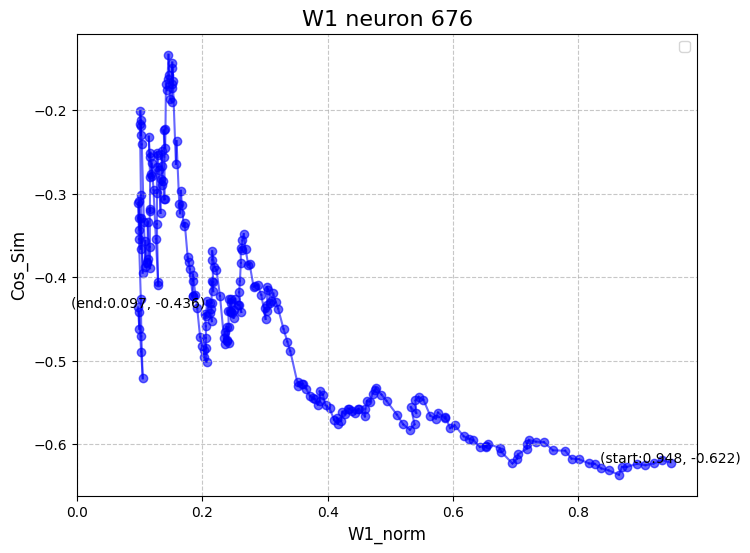

In [50]:
# norm and alignment corresponding to the neuron

for i in range(Spec_neuron_check_num):
     plt.figure(figsize=(8, 6))
     for j in range(1,check_num):
          plt.plot([W1_norm_list[j][W2_check_pos[i]],W1_norm_list[j - 1][W2_check_pos[i]]], [W1_cos_list[j][W2_check_pos[i]],W1_cos_list[j - 1][W2_check_pos[i]]],linestyle='-',  color='b', alpha=0.6)
     for j in range(check_num):
          plt.scatter(W1_norm_list[j][W2_check_pos[i]], W1_cos_list[j][W2_check_pos[i]], color='b', alpha=0.6)
     plt.annotate(f'(start:{W1_norm_list[0][W2_check_pos[i]]:.3f}, {W1_cos_list[0][W2_check_pos[i]]:.3f})',  
                 (W1_norm_list[0][W2_check_pos[i]], W1_cos_list[0][W2_check_pos[i]]),  
                 textcoords="offset points",     
                 xytext=(0, 0),        
                 ha='center',)   
     plt.annotate(f'(end:{W1_norm_list[check_num - 1][W2_check_pos[i]]:.3f}, {W1_cos_list[check_num - 1][W2_check_pos[i]]:.3f})',  
                 (W1_norm_list[check_num - 1][W2_check_pos[i]], W1_cos_list[check_num - 1][W2_check_pos[i]]),  
                 textcoords="offset points",     
                 xytext=(0, 0),        
                 ha='center',)  
     plt.title(f'W1 neuron {W2_check_pos[i]}', fontsize=16)
     plt.xlabel('W1_norm', fontsize=12)
     plt.ylabel('Cos_Sim', fontsize=12)

     plt.grid(True, linestyle='--', alpha=0.7)
     plt.xlim(0, )
     plt.legend()
     plt.show()

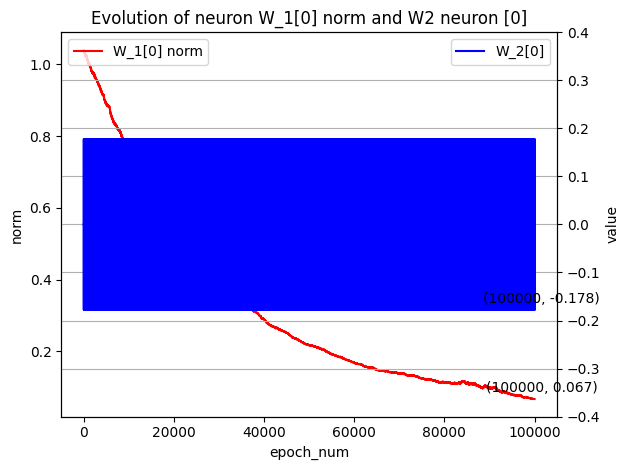

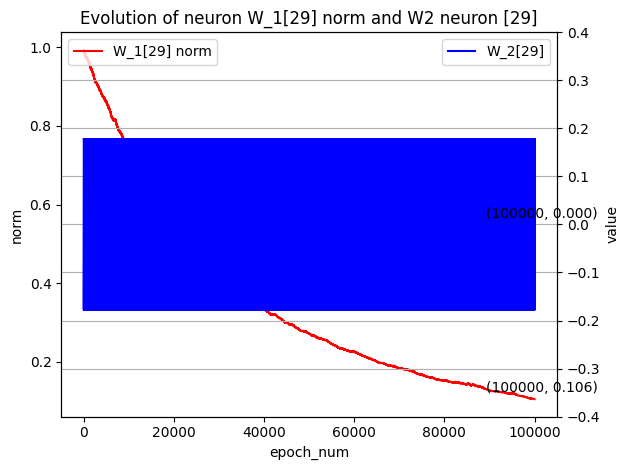

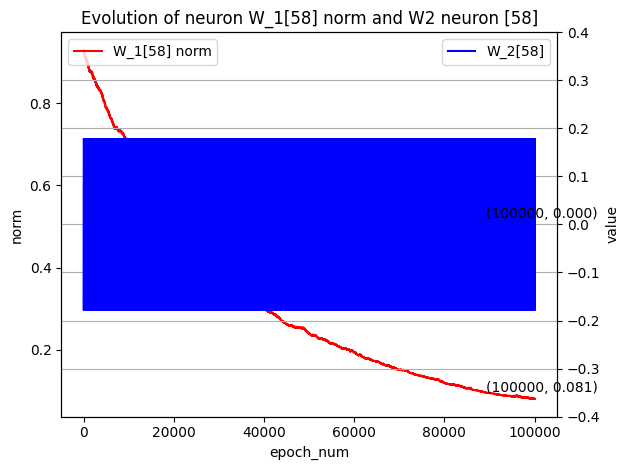

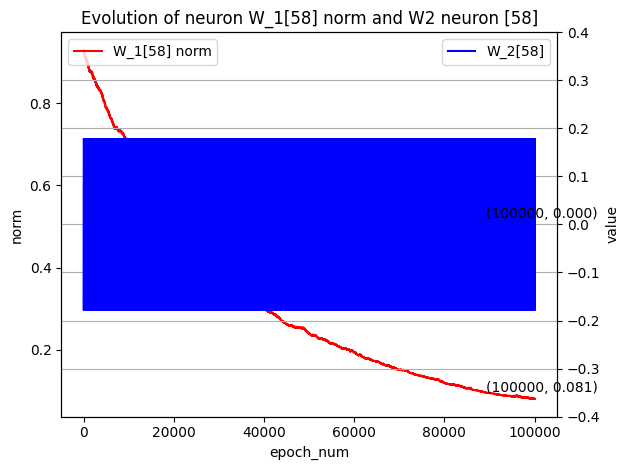

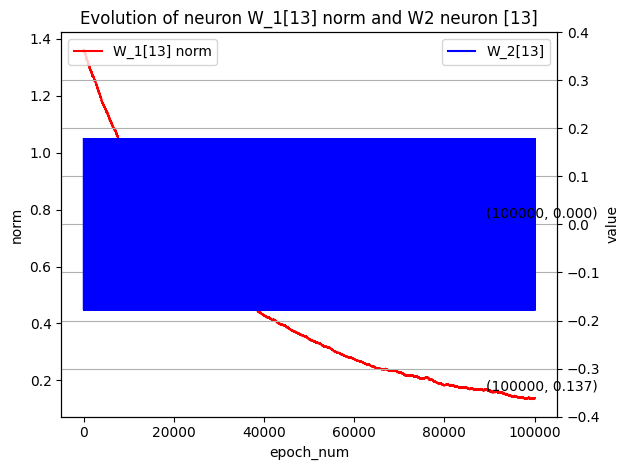

...

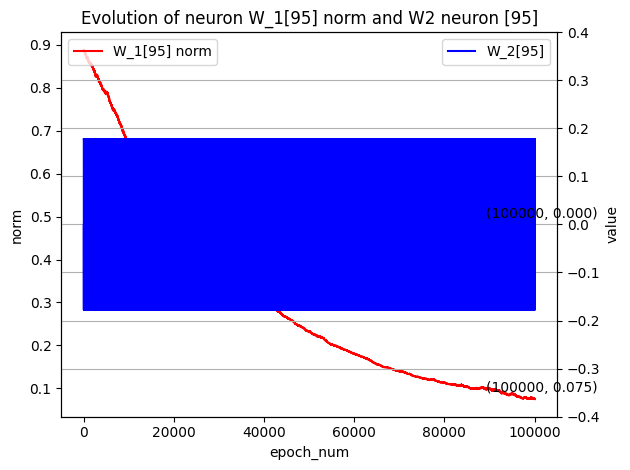

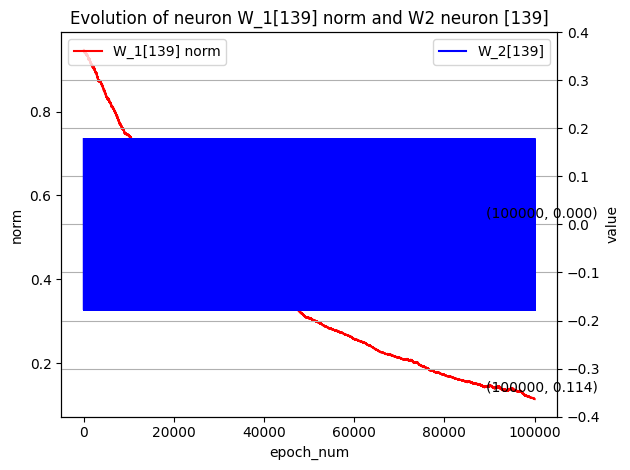

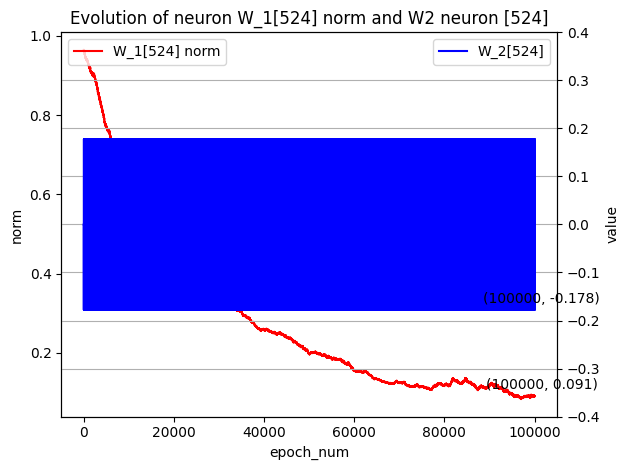

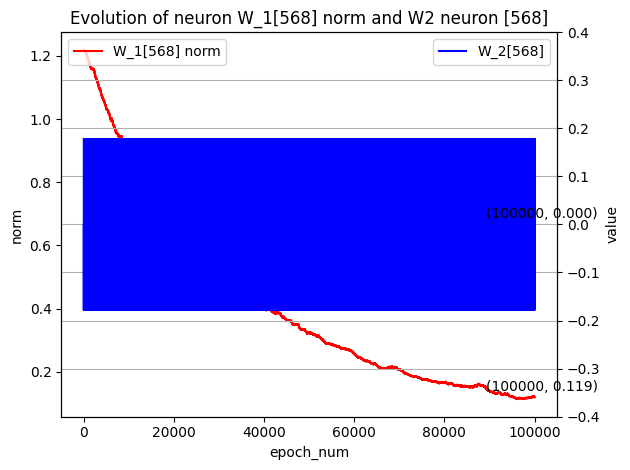

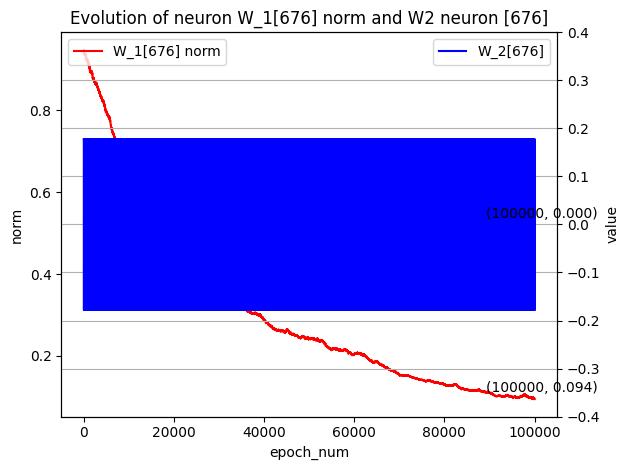

In [51]:
# Seperate norm corresponding to the neuron
test_start = 0
test_end = 100000
x = range(0, epoch_num + 1)
for i in range(Spec_neuron_check_num):
     fig, ax1 = plt.subplots()
     ax1.plot(x[test_start:test_end], W1_spec_norm[i][test_start:test_end], label=f'W_1[{W1_check_pos[i]}] norm', color='red')
     ax1.annotate(f'({x[epoch_num - 1]}, {W1_spec_norm[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W1_spec_norm[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax1.set_title(f'Evolution of neuron W_1[{W1_check_pos[i]}] norm and W2 neuron [{W2_check_pos[i]}]')
     ax1.set_xlabel('epoch_num')
     ax1.set_ylabel('norm')
     ax1.legend(loc="upper left")

   
     ax2 = ax1.twinx()
     ax2.plot(x[test_start:test_end], W2_check_list[i][test_start:test_end], label=f'W_2[{W2_check_pos[i]}]', color='blue')
     ax2.annotate(f'({x[epoch_num - 1]}, {W2_check_list[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W2_check_list[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax2.set_xlabel('epoch_num')
     ax2.set_ylabel('value')
     ax2.set_ylim(-0.4,0.4)

     ax2.legend(loc="upper right")
     ax2.grid(True)

     # for ax in (ax1, ax2):
     #      ax.axvline(x=40000, color='green', linestyle='--', linewidth=1)

     fig.tight_layout() 
     plt.show()



In [52]:
for i in range(Spec_neuron_check_num):
     p = []
     for k in range(100):
          p.append(W1_spec_norm[i][k * 20])
     print(W1_check_pos[i], p)

0 [1.0390665531158447, 1.0399630069732666, 1.0398201942443848, 1.0381865501403809, 1.0366833209991455, 1.0346463918685913, 1.0329360961914062, 1.0327706336975098, 1.0331257581710815, 1.0335032939910889, 1.0325485467910767, 1.0306960344314575, 1.0296711921691895, 1.0296062231063843, 1.0285978317260742, 1.0274693965911865, 1.0282182693481445, 1.0272115468978882, 1.0282316207885742, 1.0252271890640259, 1.024671196937561, 1.023607850074768, 1.0237046480178833, 1.0223993062973022, 1.0226075649261475, 1.0221631526947021, 1.0235332250595093, 1.0228599309921265, 1.0230622291564941, 1.022935152053833, 1.023305058479309, 1.0238919258117676, 1.022580623626709, 1.0204412937164307, 1.0179111957550049, 1.0181177854537964, 1.0153378248214722, 1.0146323442459106, 1.0129735469818115, 1.0126869678497314, 1.0106568336486816, 1.0126376152038574, 1.0127899646759033, 1.0118712186813354, 1.0119651556015015, 1.0095362663269043, 1.0101282596588135, 1.0093553066253662, 1.0082942247390747, 1.0070383548736572, 1.

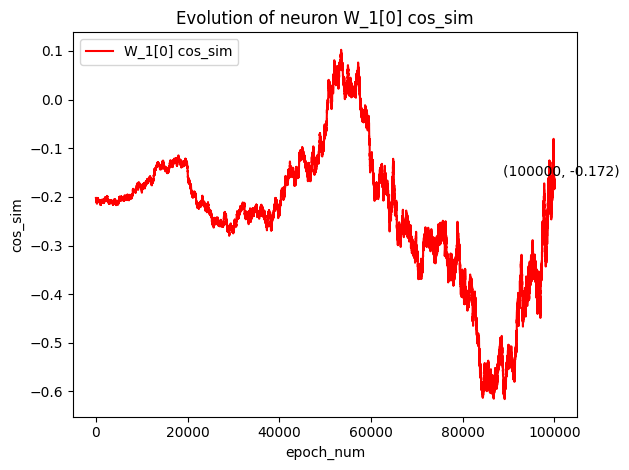

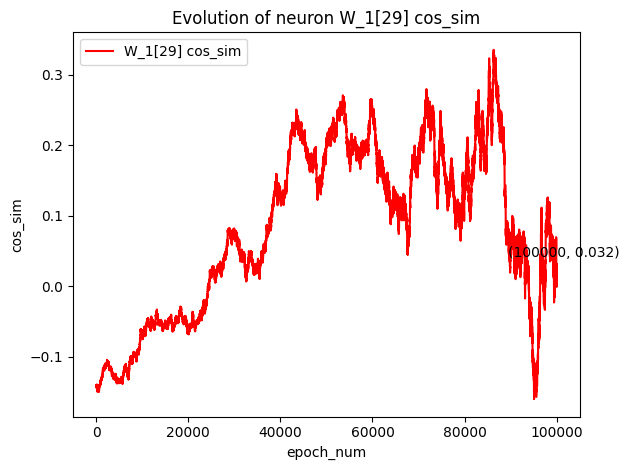

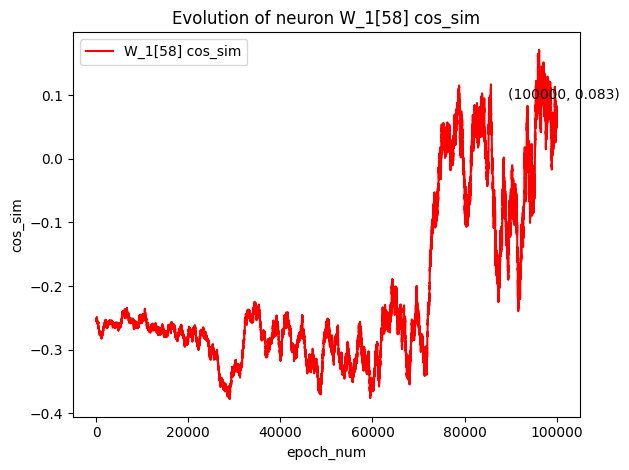

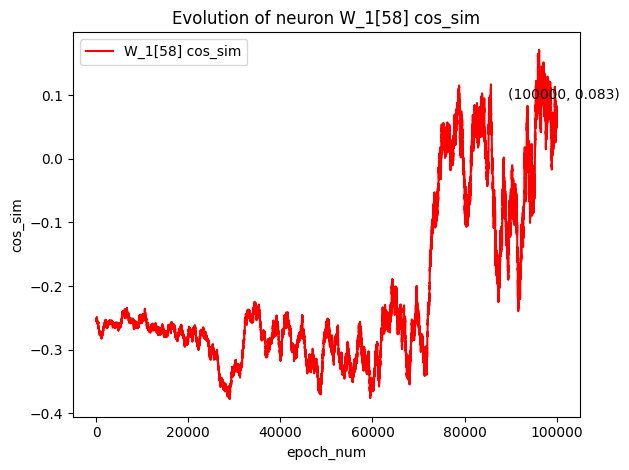

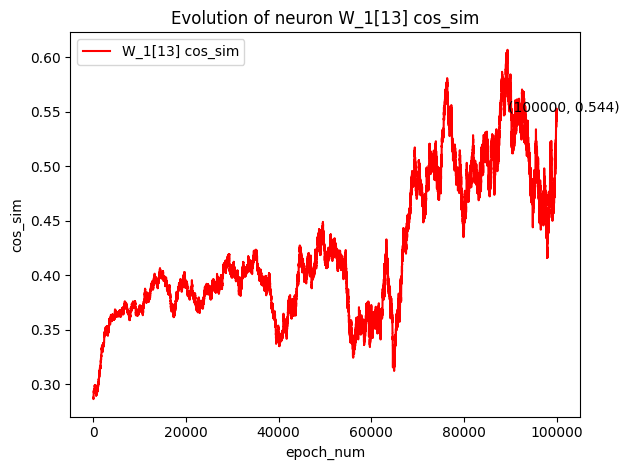

...

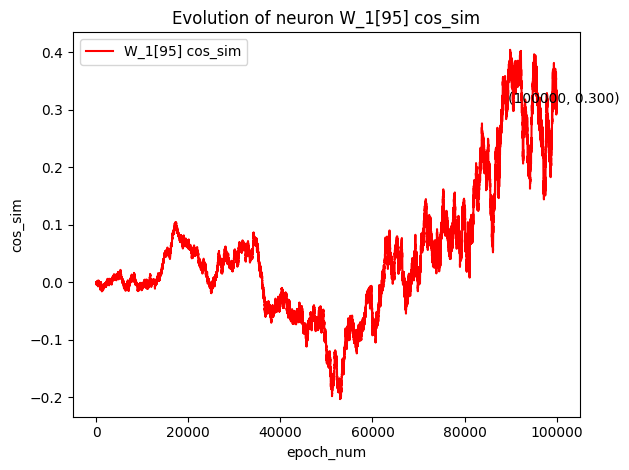

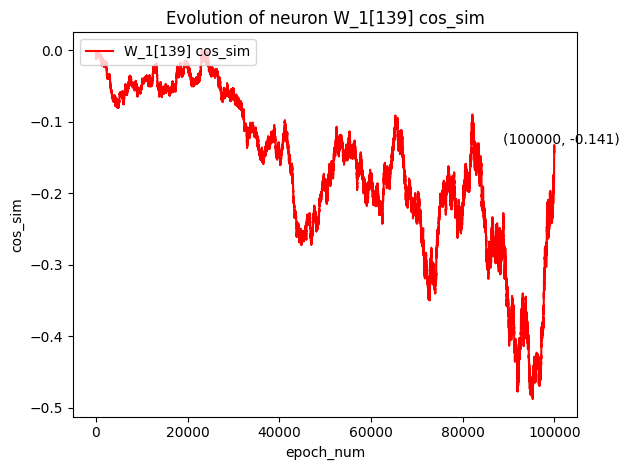

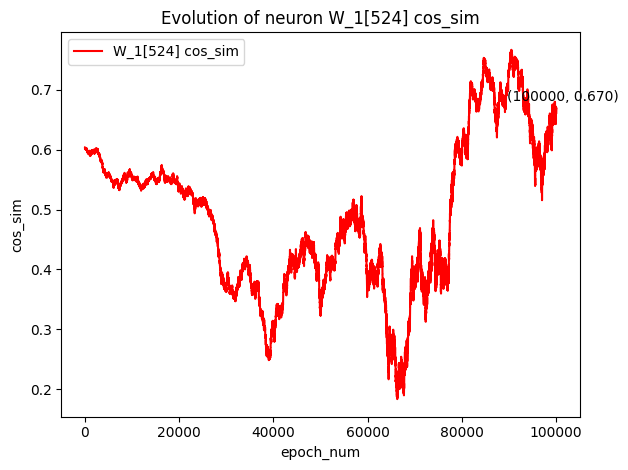

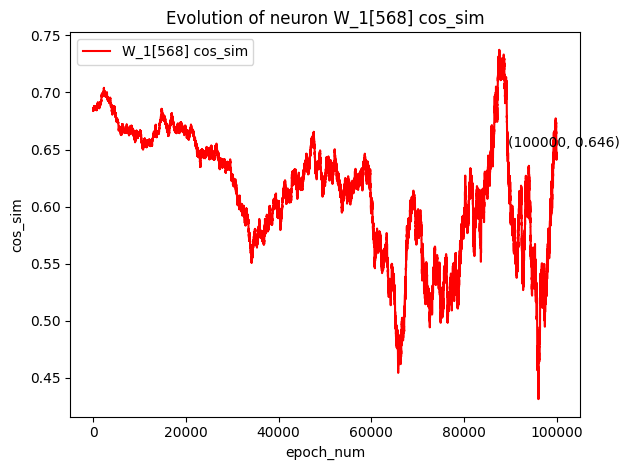

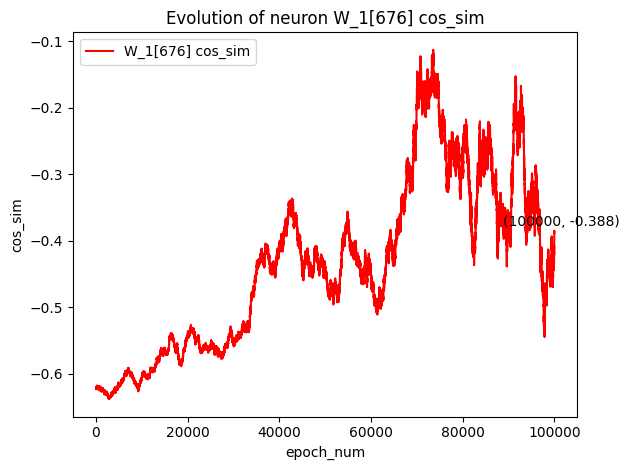

In [53]:
# Cos_sim corresponding to the neuron

x = range(0, epoch_num + 1)
for i in range(Spec_neuron_check_num):
     fig, ax1 = plt.subplots()
     ax1.plot(x, W1_spec_cossim[i], label=f'W_1[{W1_check_pos[i]}] cos_sim', color='red')
     ax1.annotate(f'({x[epoch_num - 1]}, {W1_spec_cossim[i][epoch_num - 1]:.3f})',  
                 (x[epoch_num - 1], W1_spec_cossim[i][epoch_num - 1]),  
                 textcoords="offset points",     
                 xytext=(5, 5),        
                 ha='center',)   
     ax1.set_title(f'Evolution of neuron W_1[{W1_check_pos[i]}] cos_sim')
     ax1.set_xlabel('epoch_num')
     ax1.set_ylabel('cos_sim')
     ax1.legend(loc="upper left")


     # ax2 = ax1.twinx()
     # ax2.plot(x, W2_check_list[i], label=f'W_2[{W2_check_pos[i]}]', color='blue')
     # ax2.annotate(f'({x[epoch_num - 1]}, {W2_check_list[i][epoch_num - 1]:.3f})',  
     #             (x[epoch_num - 1], W2_check_list[i][epoch_num - 1]),  
     #             textcoords="offset points",     
     #             xytext=(5, 5),        
     #             ha='center',)   
     # ax2.set_xlabel('epoch_num')
     # ax2.set_ylabel('value')
     # ax2.set_ylim(-0.3,0.3)
     # ax2.legend(loc="upper right")
     # ax2.grid(True)

     fig.tight_layout() 
     plt.show() 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


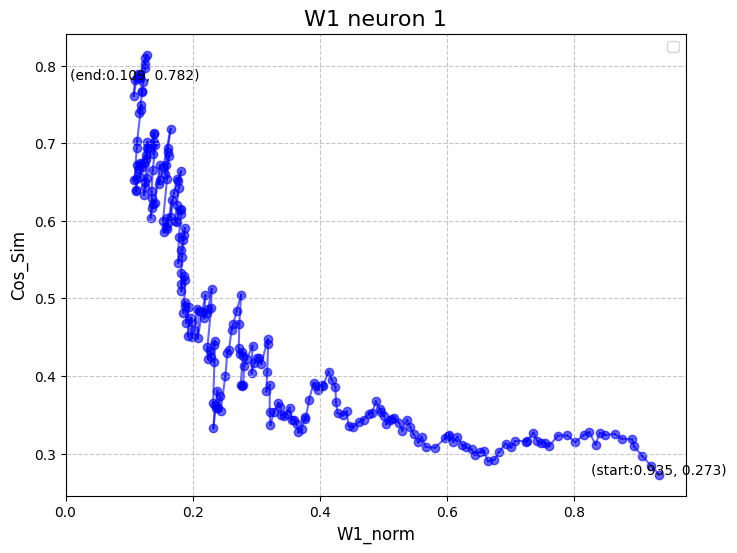

In [54]:
# norm and alignment corresponding to certain neuron
valid_point = 1
plt.figure(figsize=(8, 6))
for j in range(1,check_num):
     plt.plot([W1_norm_list[j][valid_point],W1_norm_list[j - 1][valid_point]], [W1_cos_list[j][valid_point],W1_cos_list[j - 1][valid_point]],linestyle='-',  color='b', alpha=0.6)
for j in range(check_num):
     plt.scatter(W1_norm_list[j][valid_point], W1_cos_list[j][valid_point], color='b', alpha=0.6)
plt.annotate(f'(start:{W1_norm_list[0][valid_point]:.3f}, {W1_cos_list[0][valid_point]:.3f})',  
               (W1_norm_list[0][valid_point], W1_cos_list[0][valid_point]),  
               textcoords="offset points",     
               xytext=(0, 0),        
               ha='center',)   
plt.annotate(f'(end:{W1_norm_list[check_num - 1][valid_point]:.3f}, {W1_cos_list[check_num - 1][valid_point]:.3f})',  
               (W1_norm_list[check_num - 1][valid_point], W1_cos_list[check_num - 1][valid_point]),  
               textcoords="offset points",     
               xytext=(0, 0),        
               ha='center',)  
plt.title(f'W1 neuron {valid_point}', fontsize=16)
plt.xlabel('W1_norm', fontsize=12)
plt.ylabel('Cos_Sim', fontsize=12)

plt.grid(True, linestyle='--', alpha=0.7)
plt.xlim(0, )
plt.legend()
plt.show()

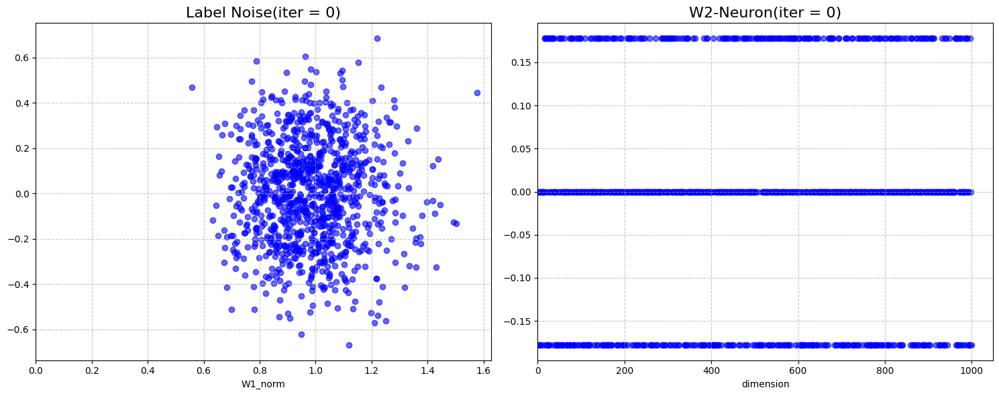

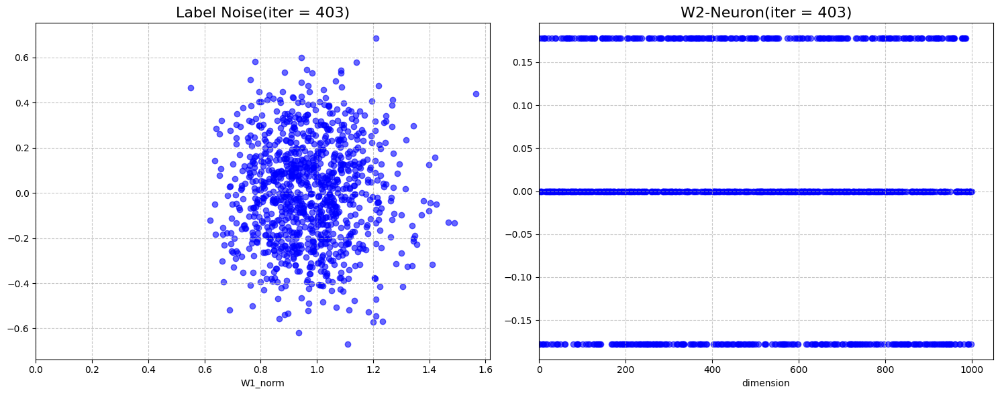

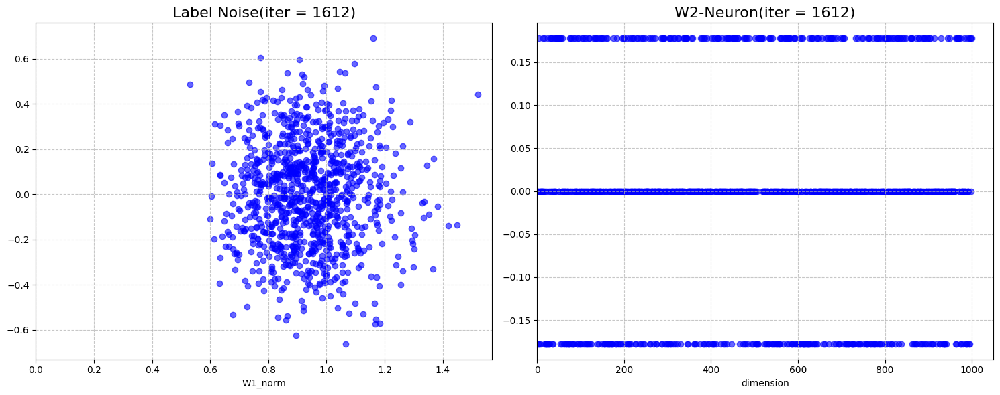

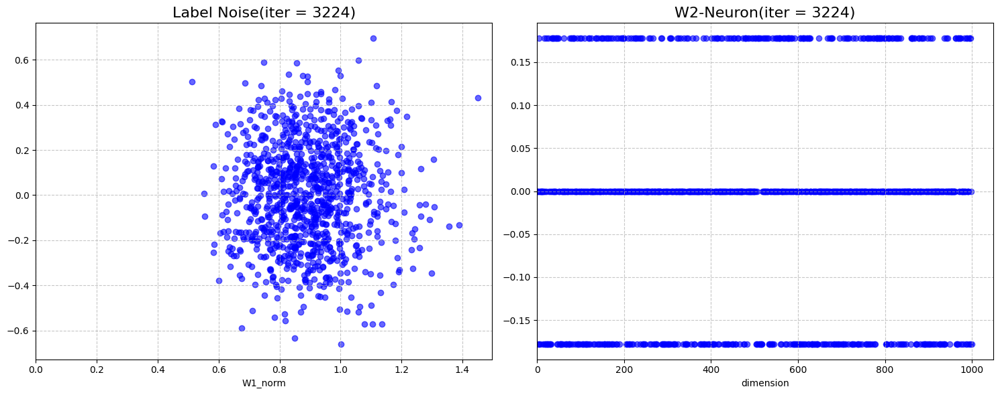

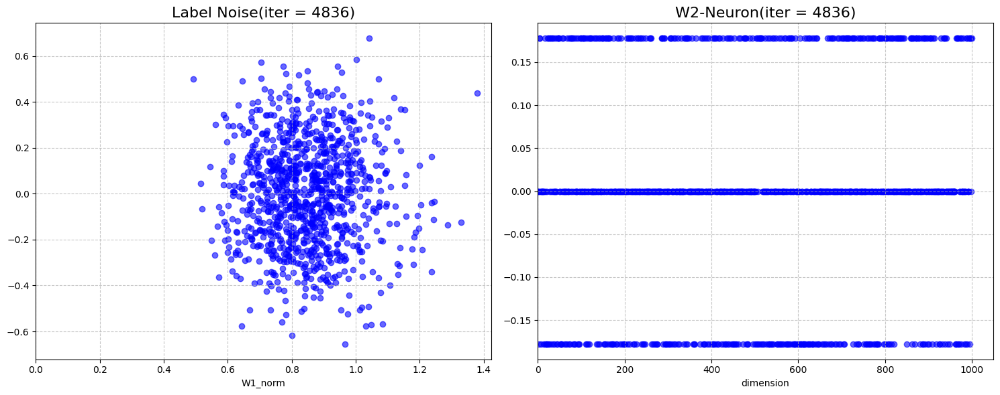

...

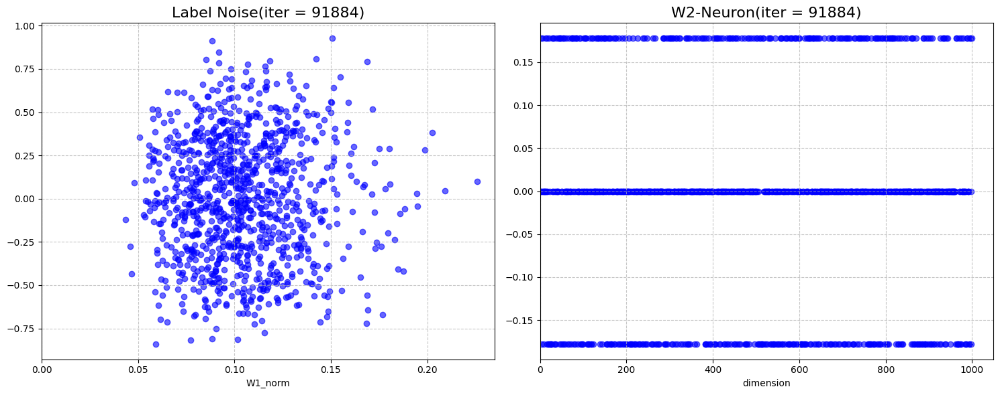

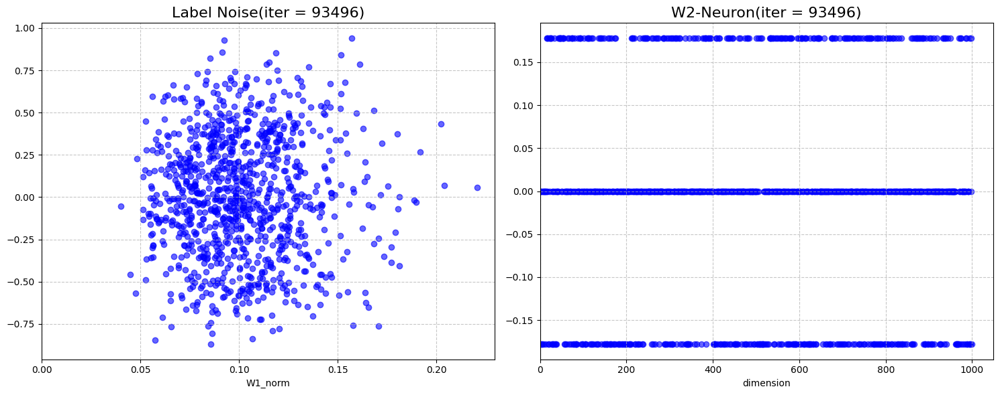

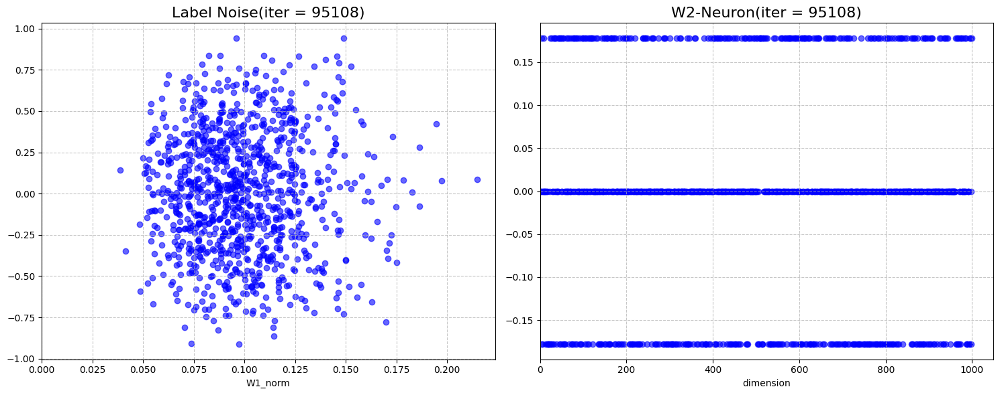

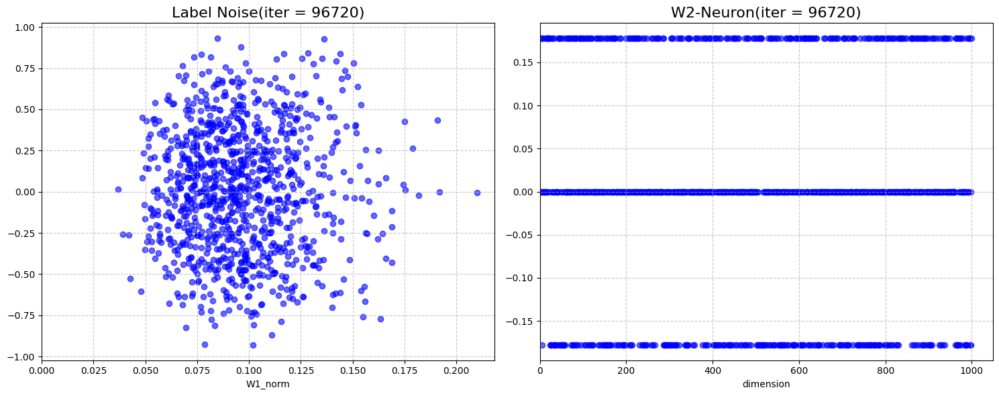

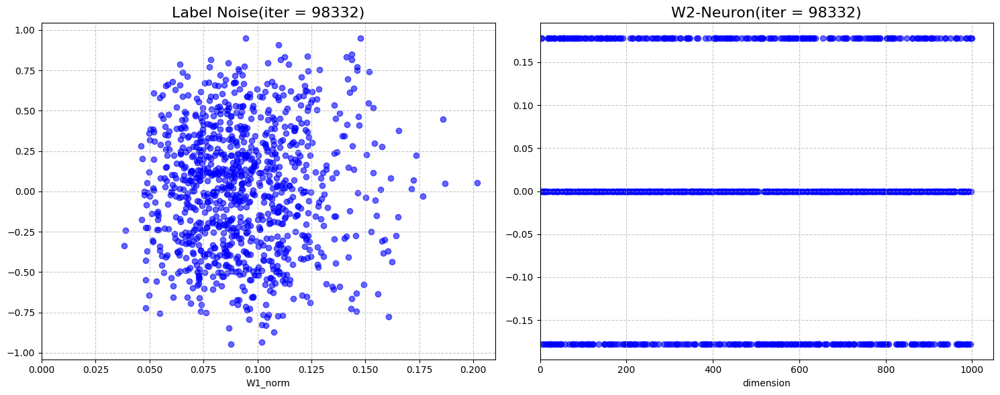

In [55]:
# # compare norm alignment with W2

for i in range(check_num):
     if i % 4 != 0 and i != 1:
          continue
     fig, axes = plt.subplots(1, 2, figsize = (15,6))  # 1行2列的子图
     axes[0].scatter(W1_norm_list[i], W1_cos_list[i], color='b', alpha=0.6)
     axes[0].set_title(f'Label Noise(iter = {check_pos[i]})',fontsize=16)
     axes[0].grid(True, linestyle='--', alpha=0.7)
     axes[0].set_xlim(left=0)
     axes[0].set_xlabel("W1_norm")

     axes[1].scatter(W2_x, W2_list[i], color='b', alpha=0.6)
     axes[1].set_title(f'W2-Neuron(iter = {check_pos[i]})', fontsize=16)
     axes[1].grid(True, linestyle='--', alpha=0.7)
     axes[1].set_xlim(left=0)
     axes[1].set_xlabel("dimension")

     plt.tight_layout()
     plt.show()